In [1]:
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sb
import warnings

from scipy.stats import kurtosis, skew
warnings.filterwarnings('ignore')

In [2]:
features = joblib.load("/mnt/shared_drive/data/brain_therapy/new_features.pkl")
features.head()

ecg_heart_rate  ecg_hrv_std  \
Participant Type context Datetime                                               
0001        2D   LL      2019-07-10 15:27:32.344       66.617321    75.818192   
                         2019-07-10 15:27:37.748       68.807339          NaN   
                         2019-07-10 15:27:42.980       61.525841          NaN   
                         2019-07-10 15:27:47.856       65.047702          NaN   
                         2019-07-10 15:27:52.468       61.174551    86.211057   

                                                  skin_temperature  eda_mean  \
Participant Type context Datetime                                              
0001        2D   LL      2019-07-10 15:27:32.344         12.958056   4.31652   
                         2019-07-10 15:27:37.748               NaN       NaN   
                         2019-07-10 15:27:42.980         12.968002       NaN   
                         2019-07-10 15:27:47.856               NaN       NaN   
                         2019-07-10 15:27:52.468         12.967983       NaN   

                                                  eda_no_of_peaks    eda_lf  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344              4.0  0.003565   
                         2019-07-10 15:27:37.748              NaN       NaN   
                         2019-07-10 15:27:42.980              NaN       NaN   
                         2019-07-10 15:27:47.856              NaN       NaN   
                         2019-07-10 15:27:52.468              NaN       NaN   

                                                    eda_hf  eda_lf_hf_ratio  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344  0.002215         1.609201   
                         2019-07-10 15:27:37.748       NaN              NaN   
                         2019-07-10 15:27:42.980       NaN              NaN   
                         2019-07-10 15:27:47.856       NaN              NaN   
                         2019-07-10 15:27:52.468       NaN              NaN   

                                                  feature_time  event_order  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344             0            1   
                         2019-07-10 15:27:37.748             1            1   
                         2019-07-10 15:27:42.980             2            1   
                         2019-07-10 15:27:47.856             3            1   
                         2019-07-10 15:27:52.468             4            1   

                                                  event_session_order  \
Participant Type context Datetime                                       
0001        2D   LL      2019-07-10 15:27:32.344                    1   
                         2019-07-10 15:27:37.748                    1   
                         2019-07-10 15:27:42.980                    1   
                         2019-07-10 15:27:47.856                    1   
                         2019-07-10 15:27:52.468                    1   

                                                  session_order  
Participant Type context Datetime                                
0001        2D   LL      2019-07-10 15:27:32.344              1  
                         2019-07-10 15:27:37.748              1  
                         2019-07-10 15:27:42.980              1  
                         2019-07-10 15:27:47.856              1  
                         2019-07-10 15:27:52.468              1

In [3]:
features_with_order = features.drop(["feature_time","event_session_order","session_order"], axis = 1)
features.drop(["feature_time","event_order","event_session_order","session_order"], axis = 1,inplace = True)

In [4]:
feature_names = features.columns.values[0:11]
feature_names

array(['ecg_heart_rate', 'ecg_hrv_std', 'skin_temperature', 'eda_mean',
       'eda_no_of_peaks', 'eda_lf', 'eda_hf', 'eda_lf_hf_ratio'],
      dtype=object)

In [5]:
participants = features.index.get_level_values("Participant").unique()
# p_type = features.index.get_level_values("context")

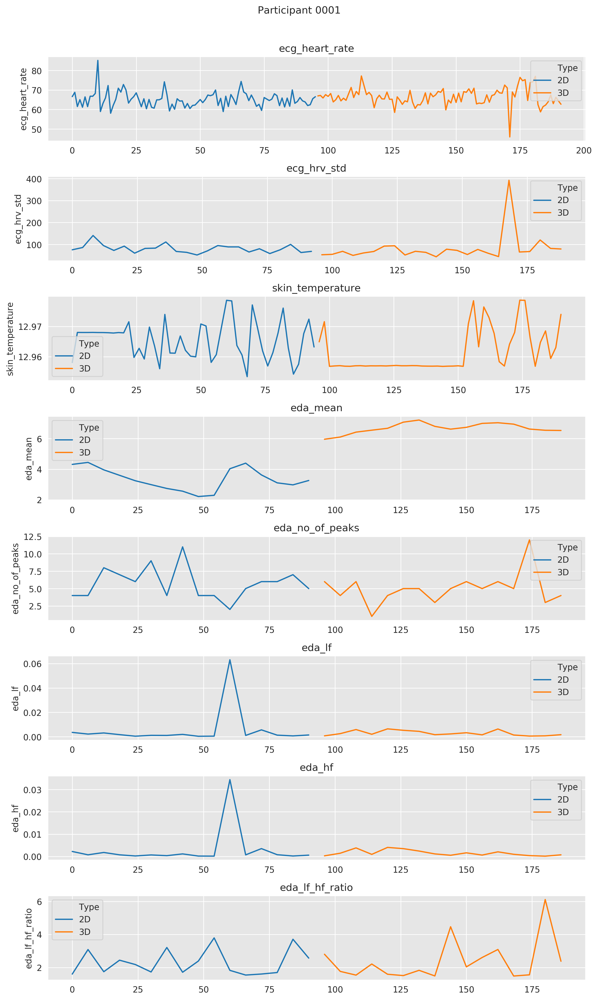

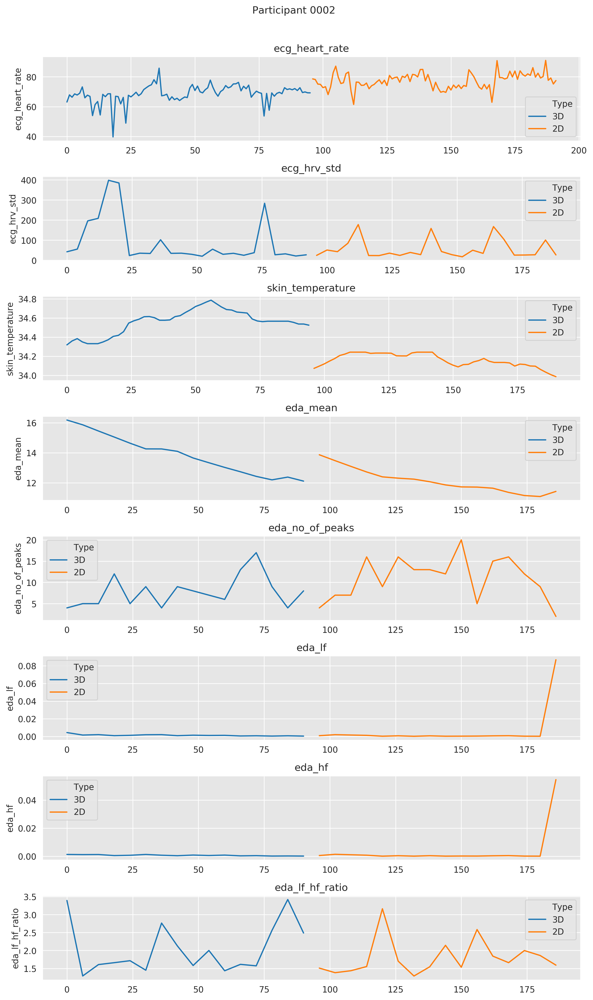

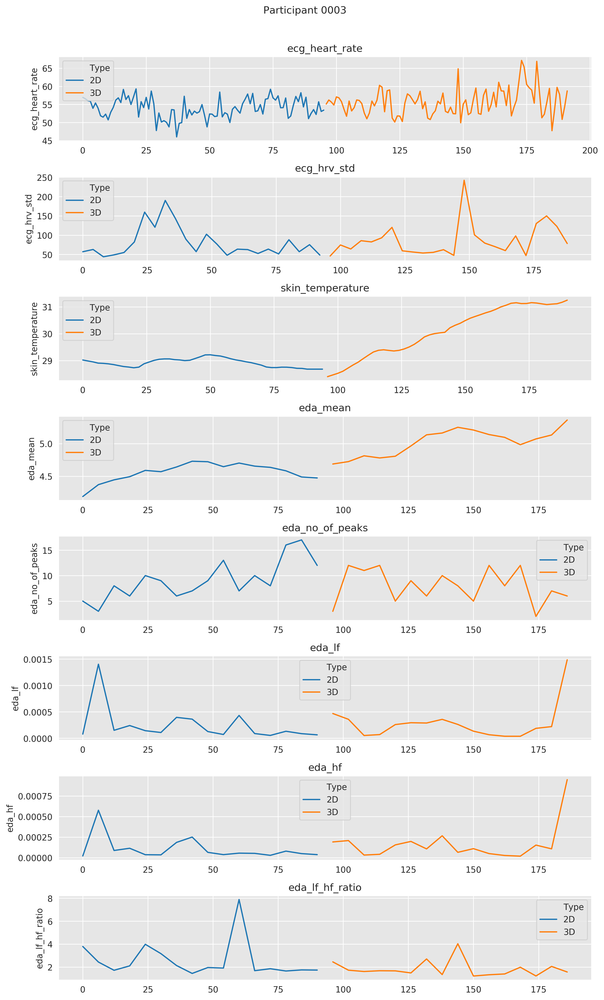

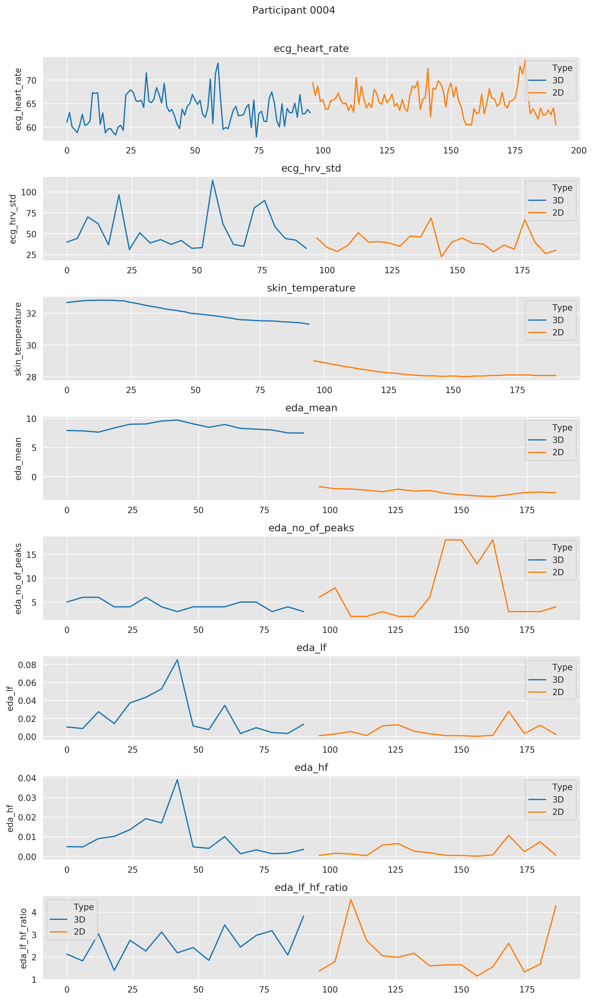

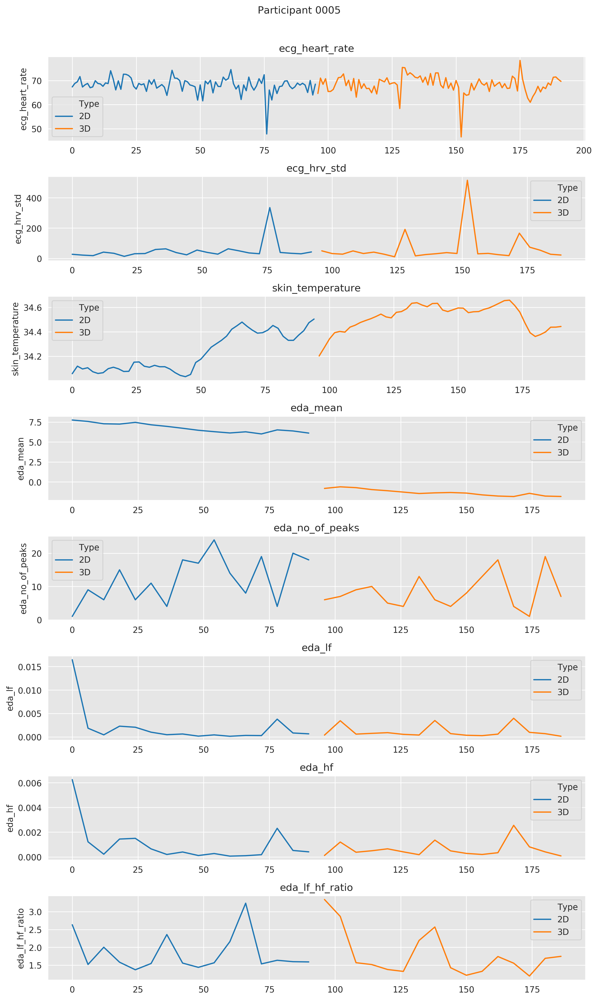

...

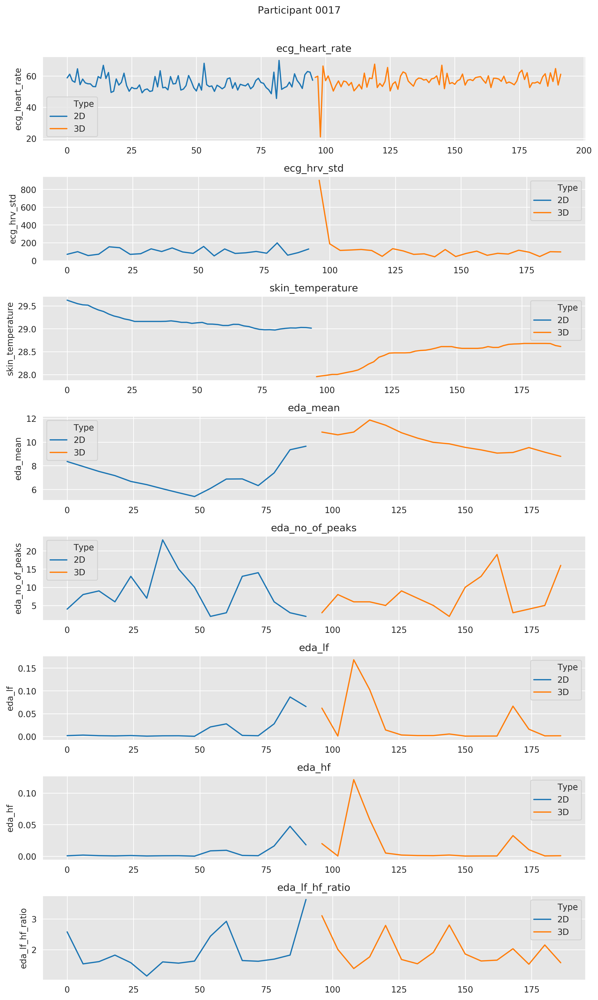

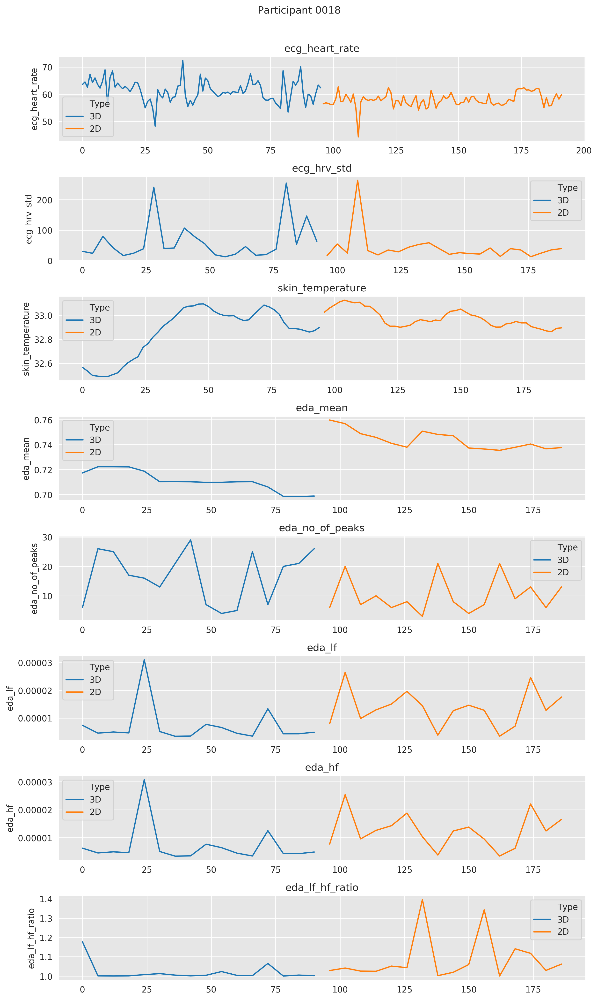

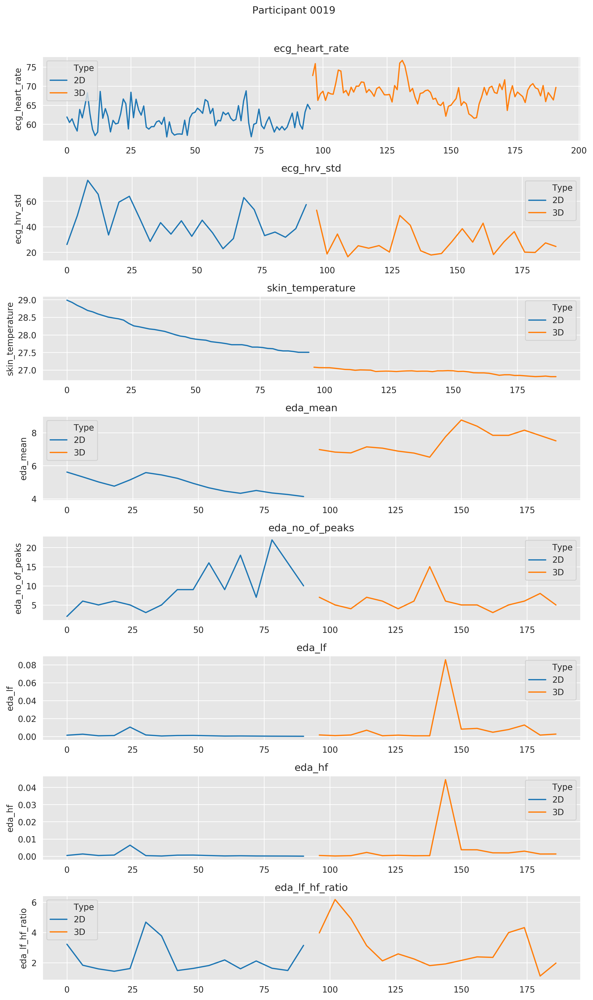

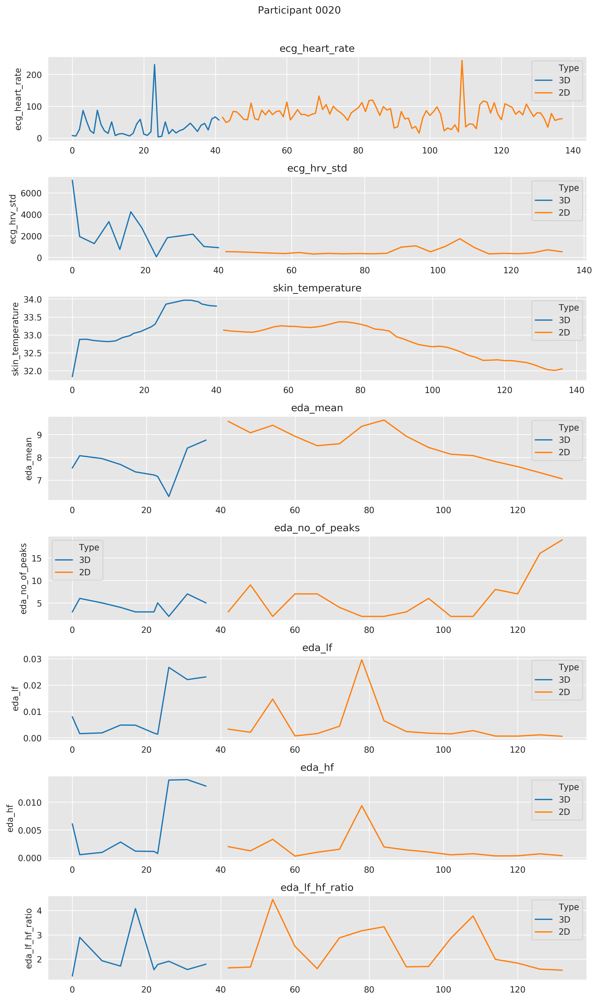

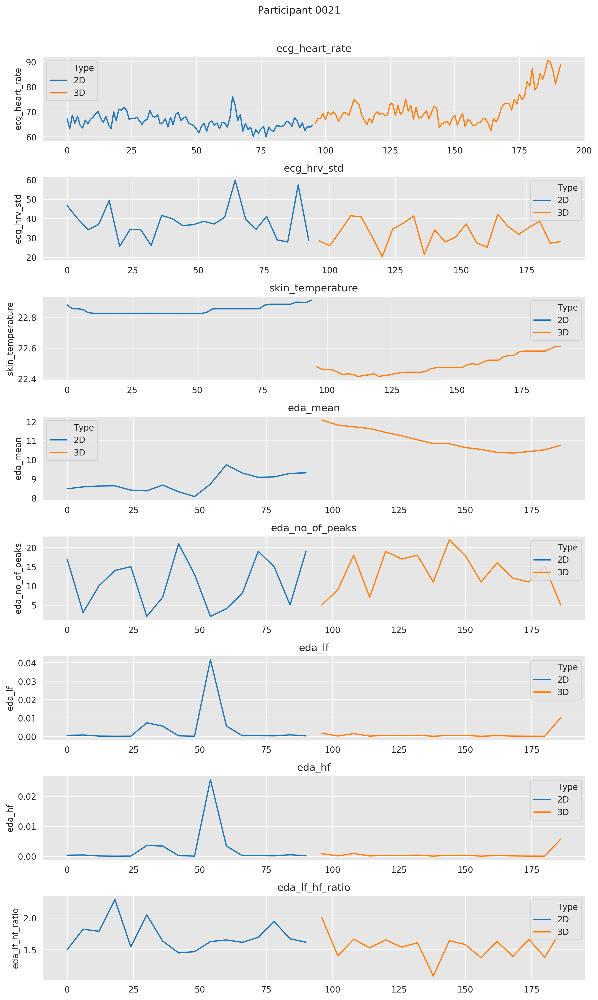

In [6]:
sb.set_style("darkgrid",{"axes.facecolor":".9"})
for participant in participants:
    fig, axes = plt.subplots(8,1, figsize = (10,16), dpi = 250)
    data = features.loc(axis = 0)[participant,:,:,:]
    ax = axes.flatten()
    for i,feature_name in enumerate(feature_names):
        sb.lineplot(x = np.arange(0,len(data[feature_name])),y = feature_name, hue = "Type", data = data[[feature_name]].reset_index(), ax = ax[i])
        ax[i].set_title(feature_name)
    suptitle = plt.suptitle("Participant {}".format(participant), y = 1.03)
    plt.tight_layout()
    plt.plot()
#     break
#     fig.savefig("/mnt/bkt_prd_dsv_brain_therapy_raw/MVP_FA_Visualizations/features_each_participant/{}.png".format(participant), 
#                dpi = fig.dpi, bbox_inches = 'tight', bbox_extra_artists = [suptitle])
